In [1]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from torch.optim.lr_scheduler import ReduceLROnPlateau
import numpy as np
import random
import time
from models import ConvLSTM, EncoderRNN
#from data.moving_mnist import MovingMNIST
#from constrain_moments import K2M
#from skimage.measure import compare_ssim as ssim
from skimage.metrics import structural_similarity as ssim
import os
#import argparse
import h5py
import torch.utils.data as data
import math
import numpy as np
import os
from PIL import Image
import matplotlib.pyplot as plt
import datetime
import itertools

In [2]:
# check tensorflow version
print("pytorch version:", torch.__version__)
# check available gpu
gpus =  torch.cuda.get_device_name(torch.cuda.current_device())
print("available gpus:", gpus)

pytorch version: 1.8.1+cu111
available gpus: Tesla V100-PCIE-32GB


In [3]:
cwd = os.getcwd()
pardir = os.path.dirname(os.path.dirname(cwd))
data_folder = os.path.join(pardir,'data',"dataset_all")
data_path = os.path.join(data_folder,'video_prediction_dataset.hdf5')
model_name = 'ConvLSTM_sky_image_dataset_interval_2min_all_data_v2'
output_folder = os.path.join(cwd,"save", model_name)
if not os.path.isdir(output_folder):
    os.makedirs(output_folder)
print("data_folder:", data_folder)
print("data_path:", data_path)
print("output_folder:", output_folder)

data_folder: /scratch/groups/abrandt/GAN_project/data/dataset_all
data_path: /scratch/groups/abrandt/GAN_project/data/dataset_all/video_prediction_dataset.hdf5
output_folder: /scratch/groups/abrandt/GAN_project/models/ConvLSTM/save/ConvLSTM_sky_image_dataset_interval_2min_all_data_v2


In [4]:
# generate handler for the hdf5 data
forecast_dataset = h5py.File(data_path, 'r')

# show structure of the hdf5 data
def get_all(name):
    if name!=None:
        print(forecast_dataset[name])
    
forecast_dataset.visit(get_all)

forecast_dataset.close()

<HDF5 group "/test" (4 members)>
<HDF5 dataset "images_log": shape (4467, 16, 64, 64, 3), type "|u1">
<HDF5 dataset "images_pred": shape (4467, 15, 64, 64, 3), type "|u1">
<HDF5 dataset "pv_log": shape (4467, 16), type "<f4">
<HDF5 dataset "pv_pred": shape (4467, 15), type "<f4">
<HDF5 group "/trainval" (4 members)>
<HDF5 dataset "images_log": shape (53336, 16, 64, 64, 3), type "|u1">
<HDF5 dataset "images_pred": shape (53336, 15, 64, 64, 3), type "|u1">
<HDF5 dataset "pv_log": shape (53336, 16), type "<f4">
<HDF5 dataset "pv_pred": shape (53336, 15), type "<f4">


In [5]:
with h5py.File(data_path,'r') as f:
    trainval = f['trainval']
    images_log_train = trainval['images_log'][...][:,::2,:,:,:]
    images_pred_train = trainval['images_pred'][...][:,::2,:,:,:]
    
    test = f['test']
    images_log_test = test['images_log'][...][:,::2,:,:,:]
    images_pred_test = test['images_pred'][...][:,::2,:,:,:]

times_curr_train = np.load(os.path.join(data_folder,"times_curr_trainval.npy"),allow_pickle=True)
times_curr_test = np.load(os.path.join(data_folder,"times_curr_test.npy"),allow_pickle=True)

print('-'*50)
print("times_curr_train.shape:", times_curr_train.shape)
print("images_log_train.shape:", images_log_train.shape)
print("images_pred_train.shape:", images_pred_train.shape) 
print("times_curr_test.shape:", times_curr_test.shape)
print("images_log_test.shape:", images_log_test.shape)
print("images_pred_test.shape:", images_pred_test.shape)
print('-'*50)

# get the input dimension for constructing the model
num_log_frame = images_log_train.shape[1]
img_side_len = images_log_train.shape[2]
num_color_channel = images_log_train.shape[4]
num_pred_frame = images_pred_train.shape[1]
image_log_dim = [num_log_frame,img_side_len,img_side_len,num_color_channel]
image_pred_dim = [num_pred_frame,img_side_len,img_side_len,num_color_channel]

print("image side length:", img_side_len)
print("number of log frames:", num_log_frame)
print("number of pred frames:", num_pred_frame)
print("number of color channels:", num_color_channel)
print("context(log) image dimension:", image_log_dim)
print("future(pred) image dimension:", image_pred_dim)

#shuffled_indices = day_block_shuffle(times_curr_train)
#times_curr_train = times_curr_train[shuffled_indices]
#images_log_train = images_log_train[shuffled_indices]
#images_pred_train = images_pred_train[shuffled_indices]

#split_ratio = 0
#split_data = [times_curr_trainval,images_log_trainval,images_pred_trainval]

#data_train, data_test = trainval_split(split_data, split_ratio)

#times_curr_train, images_log_train, images_pred_train = data_train[0], data_train[1], data_train[2] 

--------------------------------------------------
times_curr_train.shape: (53336,)
images_log_train.shape: (53336, 8, 64, 64, 3)
images_pred_train.shape: (53336, 8, 64, 64, 3)
times_curr_test.shape: (4467,)
images_log_test.shape: (4467, 8, 64, 64, 3)
images_pred_test.shape: (4467, 8, 64, 64, 3)
--------------------------------------------------
image side length: 64
number of log frames: 8
number of pred frames: 8
number of color channels: 3
context(log) image dimension: [8, 64, 64, 3]
future(pred) image dimension: [8, 64, 64, 3]


### dataloader

In [6]:
class SkyImageDataset(data.Dataset):
    #def __init__(self, data, is_train=True, n_frames_input=16, n_frames_output=15, transform=None):
    def __init__(self, data_set, transform=None):
        #self.is_train = is_train
        #self.n_frames_input = n_frames_input
        #self.n_frames_output = n_frames_output
        #self.n_frames_total = self.n_frames_input + self.n_frames_output
        self.data_set = data_set
        self.transform = transform
        self.length = self.data_set[0].shape[0]
        
    def __getitem__(self, idx):
        input_data = self.data_set[0][idx]
        output_data = self.data_set[1][idx]
        length = len(input_data)
        input_data = input_data.transpose(0, 3, 1, 2)
        output_data = output_data.transpose(0, 3, 1, 2)
        
        output_data = torch.from_numpy(output_data / 255.0).contiguous().float()
        input_data = torch.from_numpy(input_data / 255.0).contiguous().float()
        # print()
        #print(input.size())
        #print(output.size())

        out = [idx,input_data,output_data]
        return out

    def __len__(self):
        return self.length


### Training and Validate the Model

In [7]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
batch_size_train = 16
batch_size_test = 64
nepochs = 50
print('nepochs:',nepochs)
print_every = 1
eval_every = 5

cuda:0
nepochs: 50


In [8]:
data_set = SkyImageDataset([images_log_train, images_pred_train])
train_loader = torch.utils.data.DataLoader(dataset=data_set, batch_size=batch_size_train, shuffle=True, num_workers=0)

data_set = SkyImageDataset([images_log_test, images_pred_test])
test_loader = torch.utils.data.DataLoader(dataset=data_set, batch_size=batch_size_test, shuffle=False, num_workers=0)

In [9]:
def train_on_batch(input_tensor, target_tensor, encoder, encoder_optimizer, criterion,teacher_forcing_ratio):                
    encoder_optimizer.zero_grad()
    # input_tensor : torch.Size([batch_size, input_length, channels, cols, rows])
    input_length  = input_tensor.size(1)
    target_length = target_tensor.size(1)
    loss = 0
    for ei in range(input_length-1): 
        #encoder_output, encoder_hidden, output_image,_,_ = encoder(input_tensor[:,ei,:,:,:], (ei==0) )
        output_image = encoder(input_tensor[:,ei,:,:,:], (ei==0) )
        loss += criterion(output_image,input_tensor[:,ei+1,:,:,:])

    decoder_input = input_tensor[:,-1,:,:,:] # first decoder input = last image of input sequence
    
    use_teacher_forcing = True if random.random() < teacher_forcing_ratio else False 
    for di in range(target_length):
        #decoder_output, decoder_hidden, output_image,_,_ = encoder(decoder_input)
        output_image = encoder(decoder_input)
        target = target_tensor[:,di,:,:,:]
        loss += criterion(output_image,target)
        if use_teacher_forcing:
            decoder_input = target # Teacher forcing    
        else:
            decoder_input = output_image

    # Moment regularization  # encoder.phycell.cell_list[0].F.conv1.weight # size (nb_filters,in_channels,7,7)
    #k2m = K2M([7,7]).to(device)
    #for b in range(0,encoder.phycell.cell_list[0].input_dim):
        #filters = encoder.phycell.cell_list[0].F.conv1.weight[:,b,:,:] # (nb_filters,7,7)     
        #m = k2m(filters.double()) 
        #m  = m.float()   
        #loss += criterion(m, constraints) # constrains is a precomputed matrix   
    loss.backward()
    encoder_optimizer.step()
    return loss.item() / target_length

def trainIters(encoder, nepochs, print_every=10,eval_every=10,name=''):
    train_losses = []
    best_mse = float('inf')

    encoder_optimizer = torch.optim.Adam(encoder.parameters(),lr=0.001)
    scheduler_enc = ReduceLROnPlateau(encoder_optimizer, mode='min', patience=2,factor=0.1,verbose=True)
    criterion = nn.MSELoss()
    
    for epoch in range(0, nepochs):
        t0 = time.time()
        loss_epoch = 0
        teacher_forcing_ratio = np.maximum(0 , 1 - epoch * 0.03) 
        
        for i, out in enumerate(train_loader, 0):
            input_tensor = out[1].to(device)
            target_tensor = out[2].to(device)
            loss = train_on_batch(input_tensor, target_tensor, encoder, encoder_optimizer, criterion, teacher_forcing_ratio)                                   
            loss_epoch += loss
                      
        train_losses.append(loss_epoch)        
        if (epoch+1) % print_every == 0:
            print('-'*50)
            print('epoch ',epoch,  ' loss ',loss_epoch, ' time epoch ',time.time()-t0)
            print("saving model...")
            torch.save(encoder.state_dict(),'save/{0}/encoder.pth'.format(name)) 
            
        if (epoch+1) % eval_every == 0:
            mse_per_frame,mae_per_frame,mse_per_pixel,mae_per_pixel,ssim,_,_ = evaluate(encoder,test_loader) 
            scheduler_enc.step(mse_per_frame)
             
            
    return train_losses

def evaluate(encoder,loader):
    print("validation start...")
    total_mse, total_mae,total_ssim = 0,0,0
    t0 = time.time()
    predictions = []
    indices = []
    num_val_samples = len(times_curr_test)
    with torch.no_grad():
        for i, out in enumerate(loader, 0):
            indices.append(out[0])
            input_tensor = out[1].to(device)
            target_tensor = out[2].to(device)
            input_length = input_tensor.size()[1]
            target_length = target_tensor.size()[1]

            for ei in range(input_length-1):
                _  = encoder(input_tensor[:,ei,:,:,:], (ei==0))

            decoder_input = input_tensor[:,-1,:,:,:] # first decoder input= last image of input sequence
            prediction = []
            
            for di in range(target_length):
                #decoder_output, decoder_hidden, output_image,_,_ = encoder(decoder_input, False, False)
                output_image = encoder(decoder_input, False)
                decoder_input = output_image
                prediction.append(output_image.cpu())
            
            input = input_tensor.cpu().numpy()
            target = target_tensor.cpu().numpy()
            prediction =  np.stack(prediction) # (8, batch_size, 3, 64, 64)
            prediction = prediction.swapaxes(0,1)  # (batch_size,8, 3, 64, 64)
            
            mse_batch = np.mean((prediction-target)**2, axis=1).sum()
            mae_batch = np.mean(np.abs(prediction-target),  axis=1).sum() 
            total_mse += mse_batch
            total_mae += mae_batch
            
            for a in range(0,target.shape[0]):
                for b in range(0,target.shape[1]):
                    total_ssim += ssim(np.transpose(target[a,b],(1,2,0)), np.transpose(prediction[a,b],(1,2,0)), multichannel=True)
            #cross_entropy = -target*np.log(prediction) - (1-target) * np.log(1-prediction)
            #cross_entropy = cross_entropy.sum()
            #cross_entropy = cross_entropy / (args.batch_size*target_length)
            #cross_entropy = cross_entropy / (batch_size*target_length)
            #total_bce +=  cross_entropy
            predictions.append(prediction)
    
    predictions =  np.concatenate(predictions,axis=0) # (batch_size, 8, 3, 64, 64)
    total_mse_per_frame = total_mse/num_val_samples
    total_mae_per_frame = total_mae/num_val_samples
    total_mse_per_pixel = total_mse_per_frame/(img_side_len*img_side_len*num_color_channel)
    total_mae_per_pixel = total_mae_per_frame/(img_side_len*img_side_len*num_color_channel)
    total_ssim /= target.shape[1]
    total_ssim /= num_val_samples
    
    print('eval mse per frame:',total_mse_per_frame)
    print('eval mae per frame:', total_mae_per_frame) 
    print('eval mse per pixel:',total_mse_per_pixel) 
    print('eval mae per pixel:', total_mae_per_pixel) 
    print('eval ssim:',total_ssim)
    print('time:', time.time()-t0)        
    
    return total_mse_per_frame,  total_mae_per_frame, total_mse_per_pixel, total_mae_per_pixel, total_ssim, predictions, indices

In [9]:
#phycell  =  PhyCell(input_shape=(16,16), input_dim=64, F_hidden_dims=[49], n_layers=1, kernel_size=(7,7), device=device) 
convcell = ConvLSTM(input_shape=(64,64), input_dim=3, hidden_dims=[128,128,64], n_layers=3, kernel_size=(3,3), device=device) 
encoder = EncoderRNN(convcell, device)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
   
#print('phycell ' , count_parameters(phycell) )    
print('convcell ' , count_parameters(convcell) ) 
print('encoder ' , count_parameters(encoder) ) 

layer  0 input dim  3  hidden dim  128
layer  1 input dim  128  hidden dim  128
layer  2 input dim  128  hidden dim  64
convcell  2226944
encoder  2227139


In [ ]:
train_loss = trainIters(encoder,nepochs,print_every=print_every,eval_every=eval_every,name=model_name)

--------------------------------------------------
epoch  0  loss  15.255341535434127  time epoch  2199.97723197937
saving model...
--------------------------------------------------
epoch  1  loss  12.038007738185115  time epoch  2198.8657557964325
saving model...
--------------------------------------------------
epoch  2  loss  11.480283033568412  time epoch  2217.420236825943
saving model...
--------------------------------------------------
epoch  3  loss  10.915460073912982  time epoch  2202.235143661499
saving model...
--------------------------------------------------
epoch  4  loss  10.519120884651784  time epoch  2180.584851026535
saving model...
validation start...
eval mse per frame: 72.21033761473025
eval mae per frame: 572.9694889257331
eval mse per pixel: 0.005876492318907084
eval mae per pixel: 0.046628376377419685
eval ssim: 0.823883596008055
time: 138.11364650726318
--------------------------------------------------
epoch  5  loss  10.083270221075509  time epoch  2116

In [10]:
# the model training was disrupted so we load the trained model and resume training

encoder.load_state_dict(torch.load('save/{0}/encoder.pth'.format(model_name)))
encoder.train()

EncoderRNN(
  (decoder_D): decoder_D(
    (d1): Conv2d(64, 3, kernel_size=(1, 1), stride=(1, 1))
  )
  (convcell): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTM_Cell(
        (conv): Conv2d(131, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
      (1): ConvLSTM_Cell(
        (conv): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
      (2): ConvLSTM_Cell(
        (conv): Conv2d(192, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
  )
)

In [11]:
def train_on_batch(input_tensor, target_tensor, encoder, encoder_optimizer, criterion,teacher_forcing_ratio):                
    encoder_optimizer.zero_grad()
    # input_tensor : torch.Size([batch_size, input_length, channels, cols, rows])
    input_length  = input_tensor.size(1)
    target_length = target_tensor.size(1)
    loss = 0
    for ei in range(input_length-1): 
        #encoder_output, encoder_hidden, output_image,_,_ = encoder(input_tensor[:,ei,:,:,:], (ei==0) )
        output_image = encoder(input_tensor[:,ei,:,:,:], (ei==0) )
        loss += criterion(output_image,input_tensor[:,ei+1,:,:,:])

    decoder_input = input_tensor[:,-1,:,:,:] # first decoder input = last image of input sequence
    
    use_teacher_forcing = True if random.random() < teacher_forcing_ratio else False 
    for di in range(target_length):
        #decoder_output, decoder_hidden, output_image,_,_ = encoder(decoder_input)
        output_image = encoder(decoder_input)
        target = target_tensor[:,di,:,:,:]
        loss += criterion(output_image,target)
        if use_teacher_forcing:
            decoder_input = target # Teacher forcing    
        else:
            decoder_input = output_image

    # Moment regularization  # encoder.phycell.cell_list[0].F.conv1.weight # size (nb_filters,in_channels,7,7)
    #k2m = K2M([7,7]).to(device)
    #for b in range(0,encoder.phycell.cell_list[0].input_dim):
        #filters = encoder.phycell.cell_list[0].F.conv1.weight[:,b,:,:] # (nb_filters,7,7)     
        #m = k2m(filters.double()) 
        #m  = m.float()   
        #loss += criterion(m, constraints) # constrains is a precomputed matrix   
    loss.backward()
    encoder_optimizer.step()
    return loss.item() / target_length

def trainIters(encoder, nepochs, print_every=10,eval_every=10,name=''):
    train_losses = []
    best_mse = float('inf')

    encoder_optimizer = torch.optim.Adam(encoder.parameters(),lr=0.001)
    scheduler_enc = ReduceLROnPlateau(encoder_optimizer, mode='min', patience=2,factor=0.1,verbose=True)
    criterion = nn.MSELoss()
    
    for epoch in range(39, nepochs):
        t0 = time.time()
        loss_epoch = 0
        teacher_forcing_ratio = np.maximum(0 , 1 - epoch * 0.03) 
        
        for i, out in enumerate(train_loader, 0):
            input_tensor = out[1].to(device)
            target_tensor = out[2].to(device)
            loss = train_on_batch(input_tensor, target_tensor, encoder, encoder_optimizer, criterion, teacher_forcing_ratio)                                   
            loss_epoch += loss
                      
        train_losses.append(loss_epoch)        
        if (epoch+1) % print_every == 0:
            print('-'*50)
            print('epoch ',epoch,  ' loss ',loss_epoch, ' time epoch ',time.time()-t0)
            print("saving model for epoch{0}".format(epoch))
            torch.save(encoder.state_dict(),'save/{0}/encoder.pth'.format(name))
            
        if (epoch+1) % eval_every == 0:
            mse_per_frame,mae_per_frame,mse_per_pixel,mae_per_pixel,ssim,_,_ = evaluate(encoder,test_loader) 
            scheduler_enc.step(mse_per_frame)
              
    return train_losses

def evaluate(encoder,loader):
    print("validation start...")
    total_mse, total_mae,total_ssim = 0,0,0
    t0 = time.time()
    predictions = []
    indices = []
    num_val_samples = len(times_curr_test)
    with torch.no_grad():
        for i, out in enumerate(loader, 0):
            indices.append(out[0])
            input_tensor = out[1].to(device)
            target_tensor = out[2].to(device)
            input_length = input_tensor.size()[1]
            target_length = target_tensor.size()[1]

            for ei in range(input_length-1):
                _  = encoder(input_tensor[:,ei,:,:,:], (ei==0))

            decoder_input = input_tensor[:,-1,:,:,:] # first decoder input= last image of input sequence
            prediction = []
            
            for di in range(target_length):
                #decoder_output, decoder_hidden, output_image,_,_ = encoder(decoder_input, False, False)
                output_image = encoder(decoder_input, False)
                decoder_input = output_image
                prediction.append(output_image.cpu())
            
            input = input_tensor.cpu().numpy()
            target = target_tensor.cpu().numpy()
            prediction =  np.stack(prediction) # (8, batch_size, 3, 64, 64)
            prediction = prediction.swapaxes(0,1)  # (batch_size,8, 3, 64, 64)
            
            mse_batch = np.mean((prediction-target)**2, axis=1).sum()
            mae_batch = np.mean(np.abs(prediction-target),  axis=1).sum() 
            total_mse += mse_batch
            total_mae += mae_batch
            
            for a in range(0,target.shape[0]):
                for b in range(0,target.shape[1]):
                    total_ssim += ssim(np.transpose(target[a,b],(1,2,0)), np.transpose(prediction[a,b],(1,2,0)), multichannel=True)
            #cross_entropy = -target*np.log(prediction) - (1-target) * np.log(1-prediction)
            #cross_entropy = cross_entropy.sum()
            #cross_entropy = cross_entropy / (args.batch_size*target_length)
            #cross_entropy = cross_entropy / (batch_size*target_length)
            #total_bce +=  cross_entropy
            predictions.append(prediction)
    
    predictions =  np.concatenate(predictions,axis=0) # (batch_size, 8, 3, 64, 64)
    total_mse_per_frame = total_mse/num_val_samples
    total_mae_per_frame = total_mae/num_val_samples
    total_mse_per_pixel = total_mse_per_frame/(img_side_len*img_side_len*num_color_channel)
    total_mae_per_pixel = total_mae_per_frame/(img_side_len*img_side_len*num_color_channel)
    total_ssim /= target.shape[1]
    total_ssim /= num_val_samples
    
    print('eval mse per frame:',total_mse_per_frame)
    print('eval mae per frame:', total_mae_per_frame) 
    print('eval mse per pixel:',total_mse_per_pixel) 
    print('eval mae per pixel:', total_mae_per_pixel) 
    print('eval ssim:',total_ssim)
    print('time:', time.time()-t0)        
    
    return total_mse_per_frame,  total_mae_per_frame, total_mse_per_pixel, total_mae_per_pixel, total_ssim, predictions, indices

In [12]:
train_loss = trainIters(encoder,nepochs,print_every=print_every,eval_every=eval_every,name=model_name)

--------------------------------------------------
epoch  39  loss  10.095018978638109  time epoch  2172.718298435211
saving model for epoch39
validation start...
eval mse per frame: 50.116224539581495
eval mae per frame: 436.0139225194832
eval mse per pixel: 0.0040784687939112545
eval mae per pixel: 0.0354829038508694
eval ssim: 0.8397574611781916
time: 135.66319918632507
--------------------------------------------------
epoch  40  loss  10.057863386988174  time epoch  2117.3547103405
saving model for epoch40
--------------------------------------------------
epoch  41  loss  9.999208589550108  time epoch  2116.4019298553467
saving model for epoch41
--------------------------------------------------
epoch  42  loss  9.94936477940064  time epoch  2116.387946367264
saving model for epoch42
--------------------------------------------------
epoch  43  loss  9.890442992909811  time epoch  2117.1243669986725
saving model for epoch43
--------------------------------------------------
epoch

### evaluation

In [13]:
encoder.load_state_dict(torch.load('save/{0}/encoder.pth'.format(model_name)))
encoder.eval()
mse_per_frame, mae_per_frame, mse_per_pixel, mae_per_pixel, SSIM, predictions, indices = evaluate(encoder,test_loader)

validation start...
eval mse per frame: 51.04497386829042
eval mae per frame: 439.12020780427997
eval mse per pixel: 0.00415405060777103
eval mae per pixel: 0.03573569399448893
eval ssim: 0.8380668341396039
time: 126.35499691963196


In [14]:
print(predictions.shape)
predictions = predictions.transpose((0,1,3,4,2))
print(predictions.shape)

(4467, 8, 3, 64, 64)
(4467, 8, 64, 64, 3)


In [15]:
np.save('save/{0}/predicted_images.npy'.format(model_name), predictions)

In [16]:
random.seed(0)
select_num_samples = 30
select_idx = random.sample(np.arange(len(predictions)).tolist(),select_num_samples)
select_idx

[3155,
 3445,
 331,
 2121,
 4188,
 3980,
 3317,
 2484,
 3904,
 2933,
 1789,
 4134,
 1140,
 2308,
 1144,
 776,
 2052,
 4362,
 1203,
 2540,
 809,
 604,
 2704,
 3867,
 824,
 2898,
 3556,
 2590,
 1675,
 3907]

-------------------------------------------------- sample  1 --------------------------------------------------


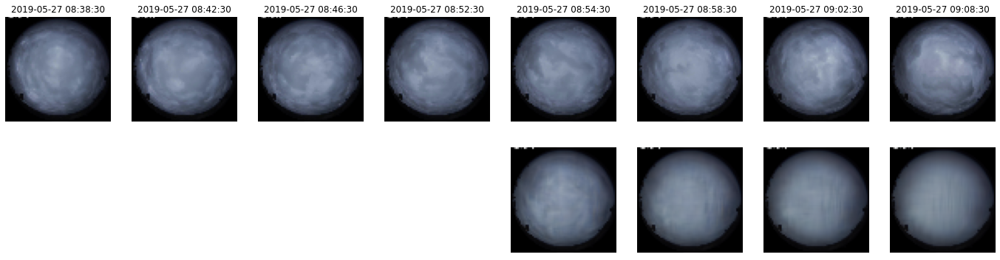

-------------------------------------------------- sample  2 --------------------------------------------------


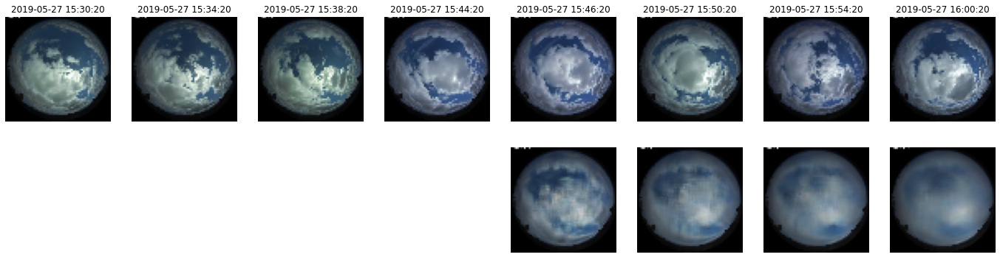

-------------------------------------------------- sample  3 --------------------------------------------------


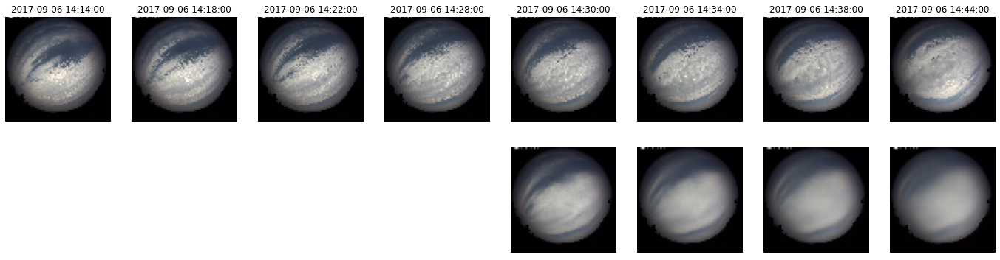

-------------------------------------------------- sample  4 --------------------------------------------------


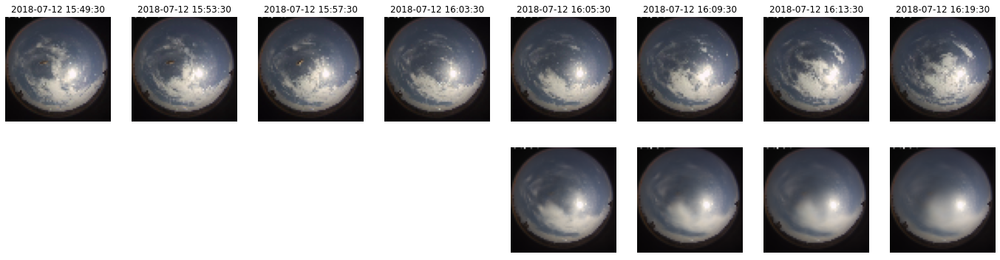

-------------------------------------------------- sample  5 --------------------------------------------------


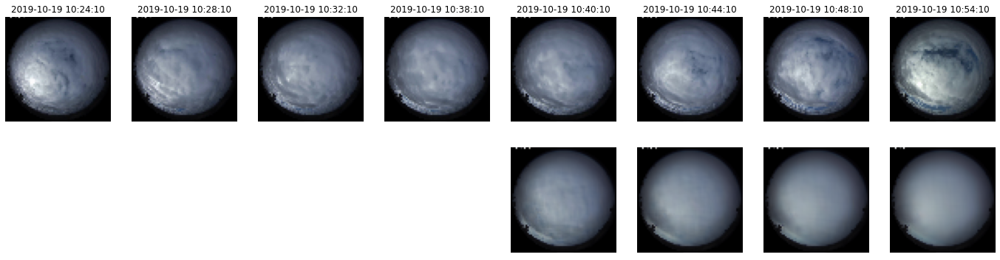

-------------------------------------------------- sample  6 --------------------------------------------------


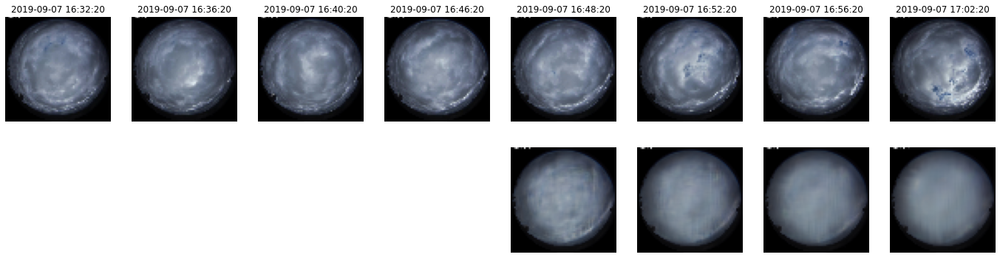

-------------------------------------------------- sample  7 --------------------------------------------------


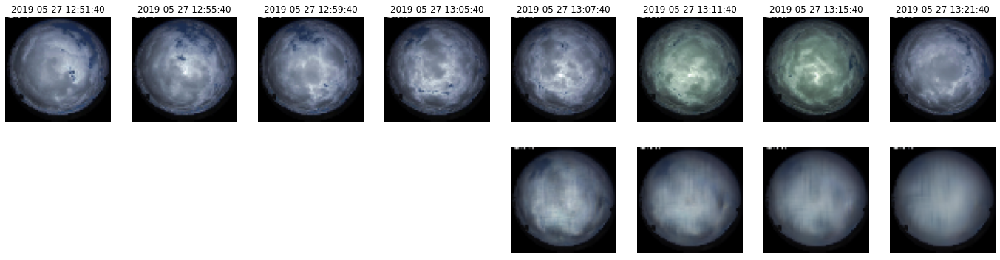

-------------------------------------------------- sample  8 --------------------------------------------------


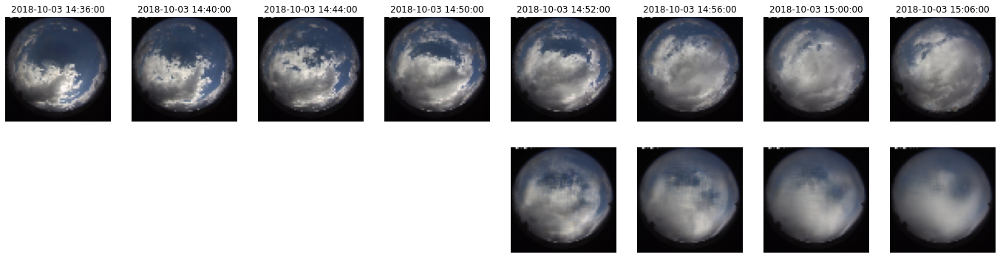

-------------------------------------------------- sample  9 --------------------------------------------------


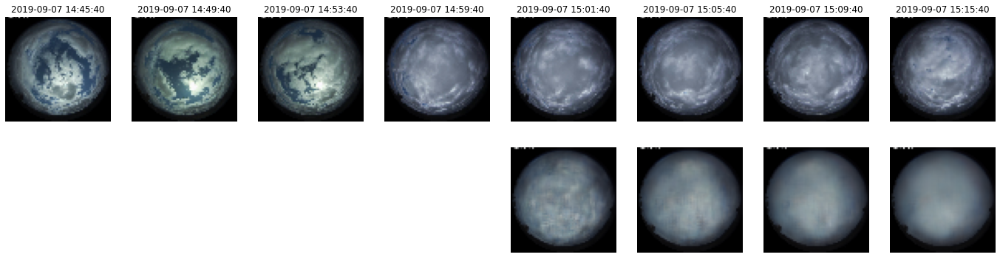

-------------------------------------------------- sample  10 --------------------------------------------------


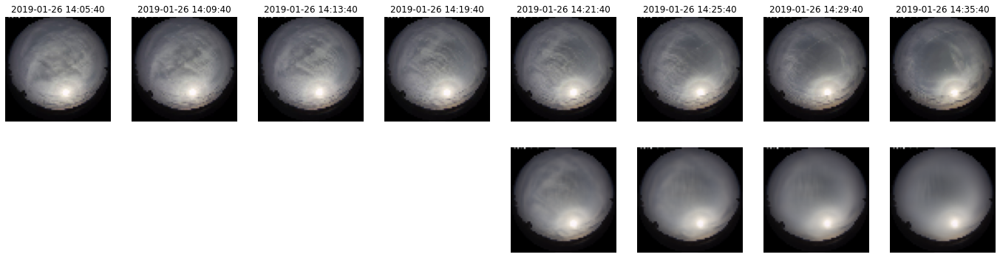

-------------------------------------------------- sample  11 --------------------------------------------------


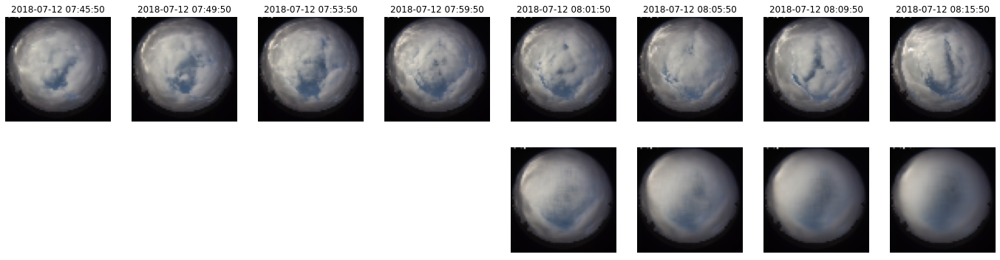

-------------------------------------------------- sample  12 --------------------------------------------------


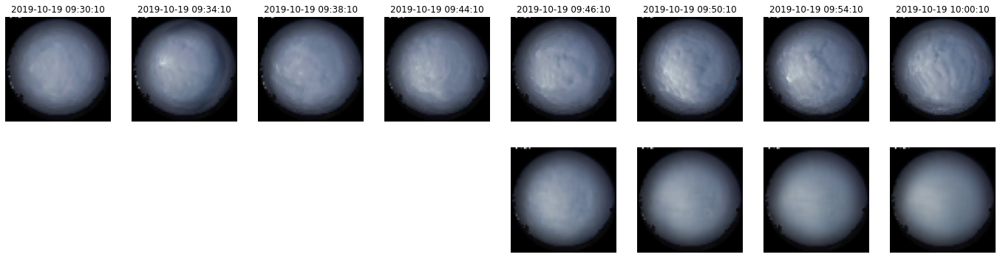

-------------------------------------------------- sample  13 --------------------------------------------------


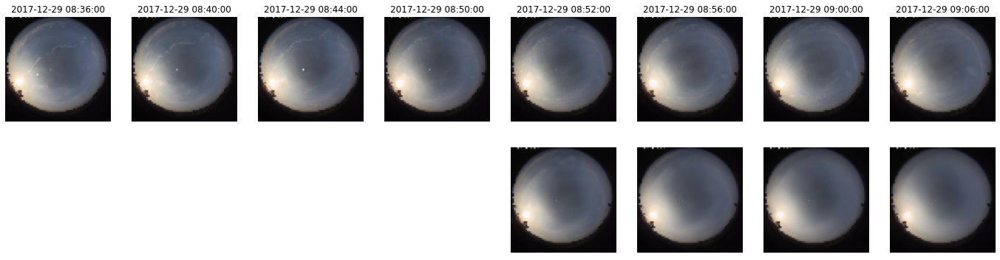

-------------------------------------------------- sample  14 --------------------------------------------------


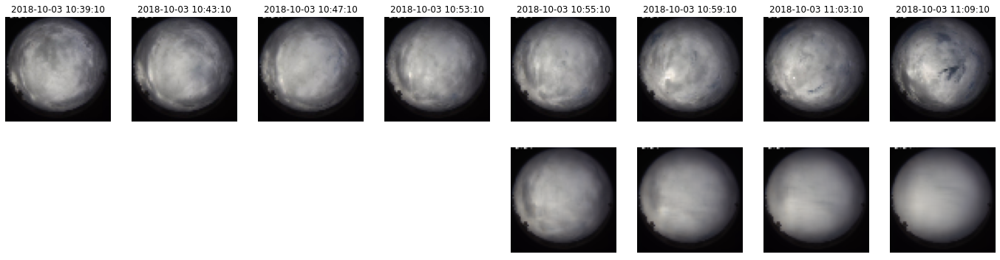

-------------------------------------------------- sample  15 --------------------------------------------------


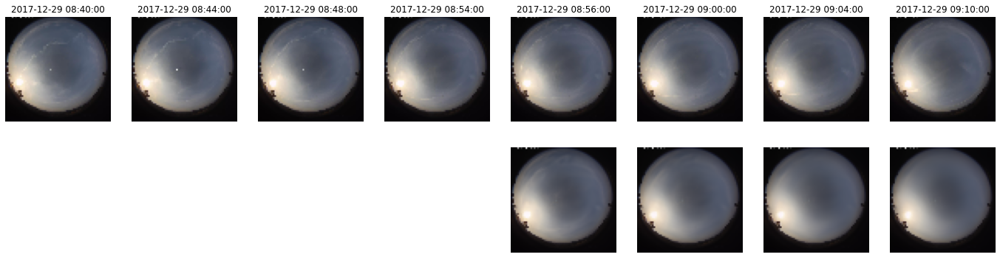

-------------------------------------------------- sample  16 --------------------------------------------------


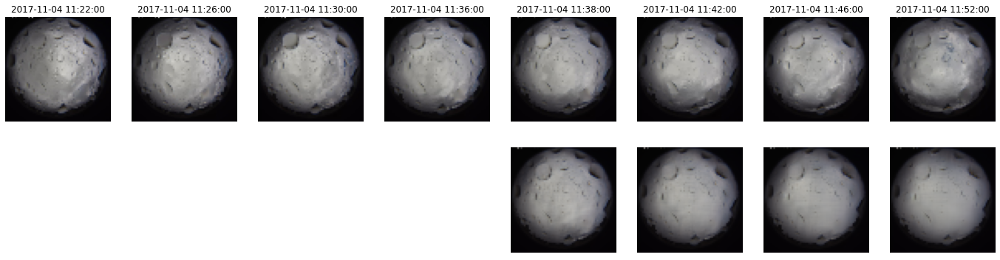

-------------------------------------------------- sample  17 --------------------------------------------------


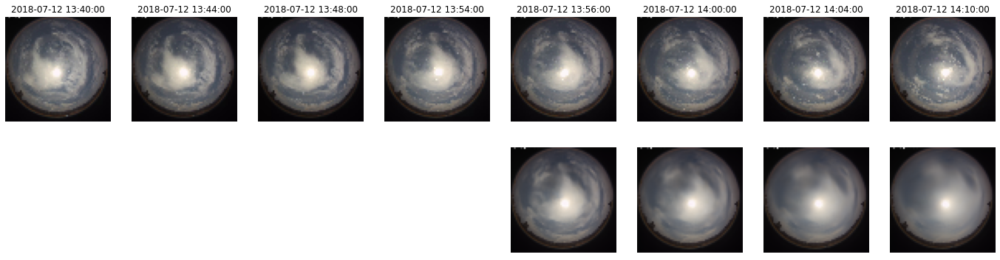

-------------------------------------------------- sample  18 --------------------------------------------------


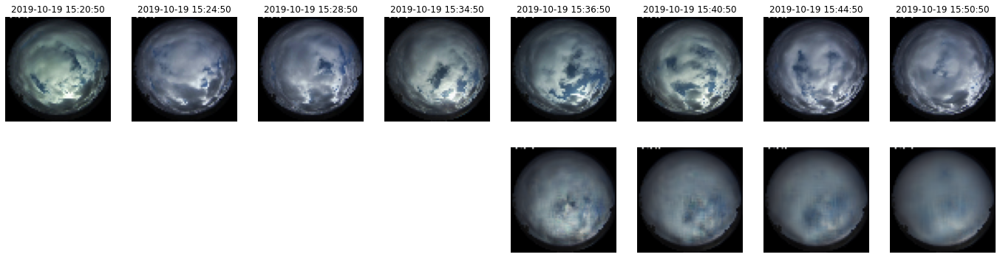

-------------------------------------------------- sample  19 --------------------------------------------------


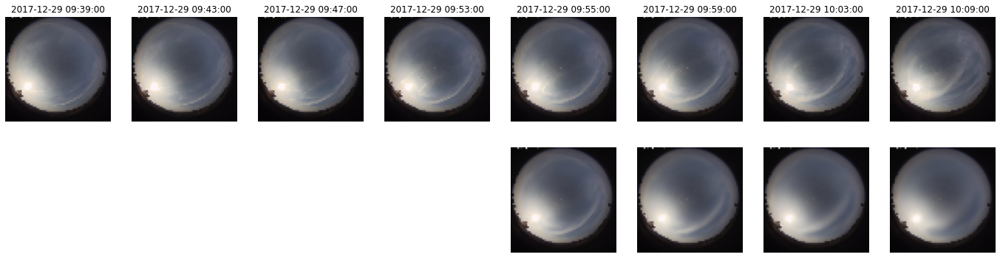

-------------------------------------------------- sample  20 --------------------------------------------------


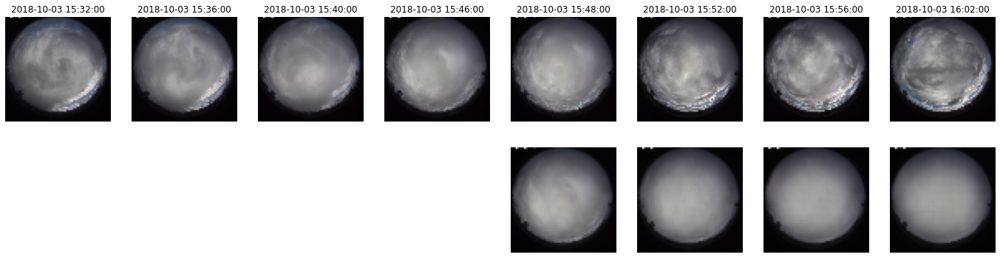

-------------------------------------------------- sample  21 --------------------------------------------------


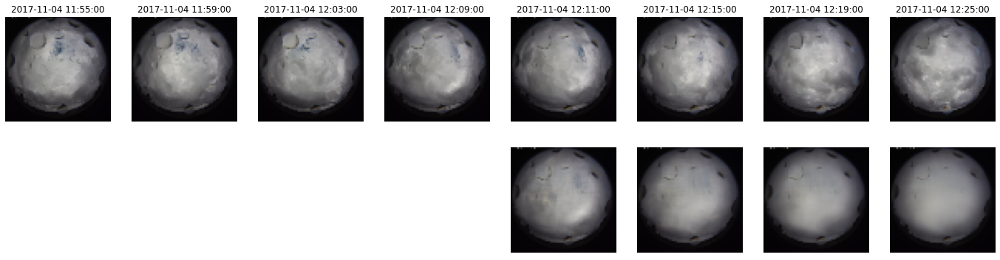

-------------------------------------------------- sample  22 --------------------------------------------------


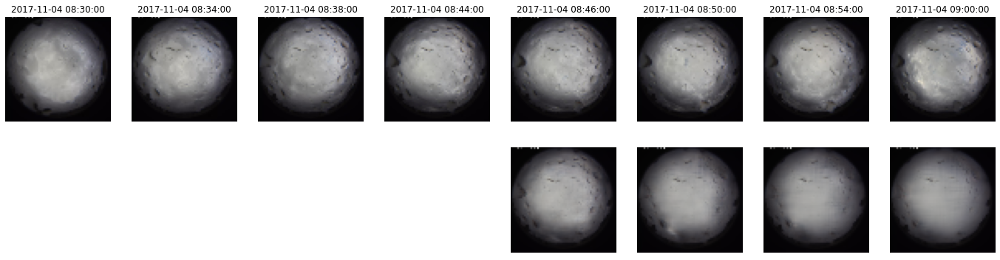

-------------------------------------------------- sample  23 --------------------------------------------------


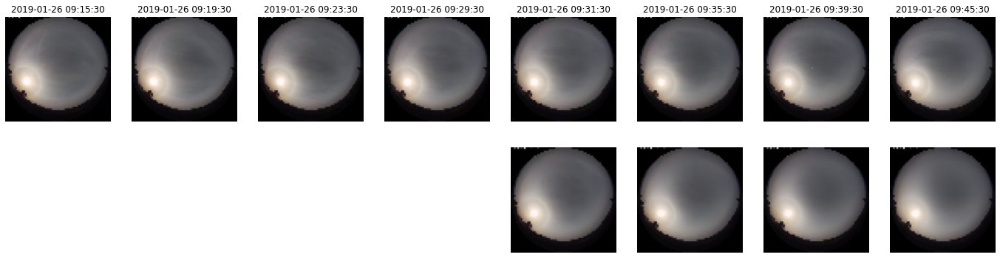

-------------------------------------------------- sample  24 --------------------------------------------------


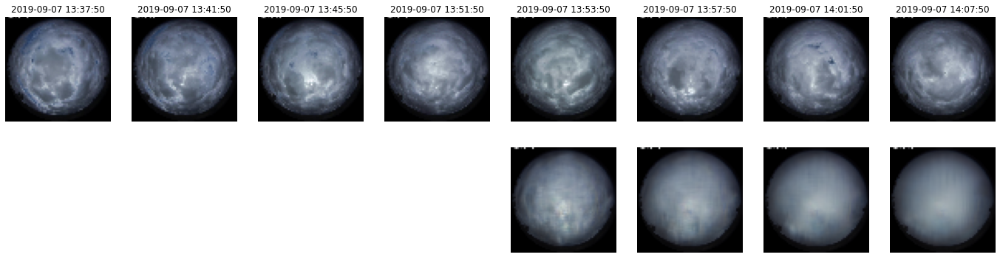

-------------------------------------------------- sample  25 --------------------------------------------------


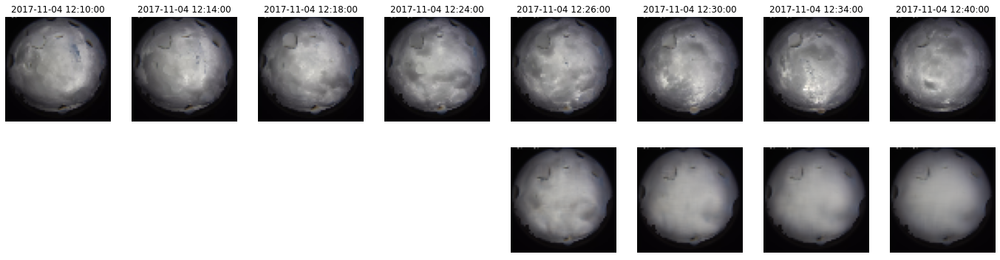

-------------------------------------------------- sample  26 --------------------------------------------------


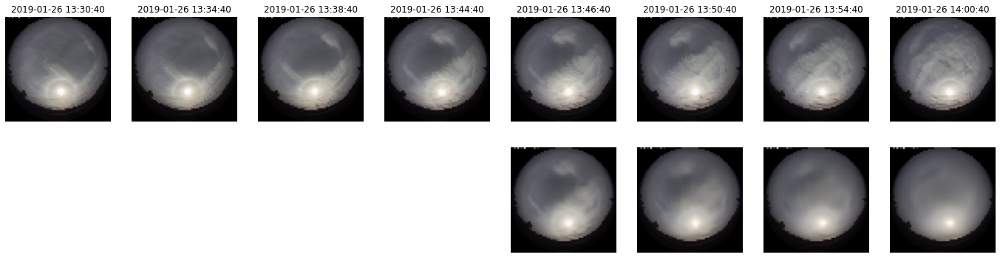

-------------------------------------------------- sample  27 --------------------------------------------------


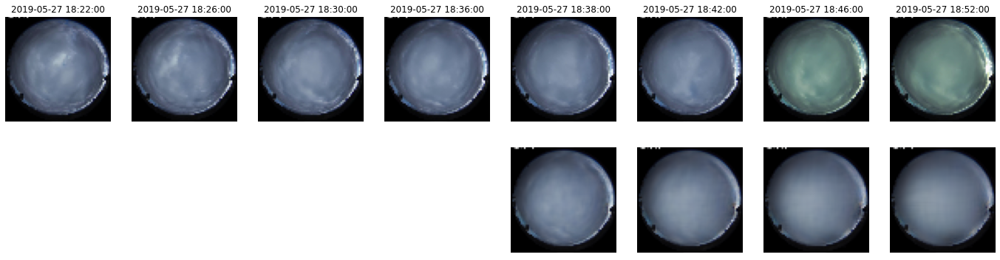

-------------------------------------------------- sample  28 --------------------------------------------------


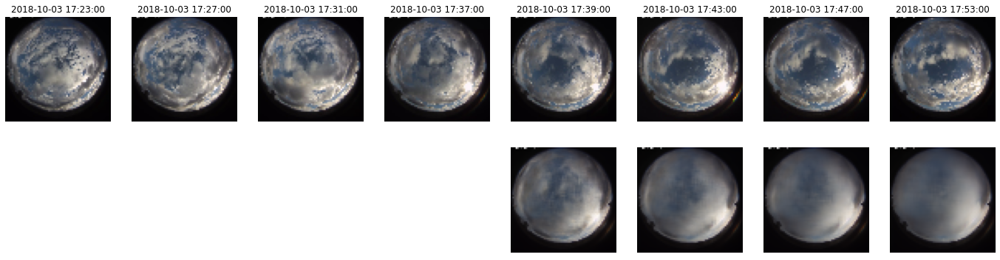

-------------------------------------------------- sample  29 --------------------------------------------------


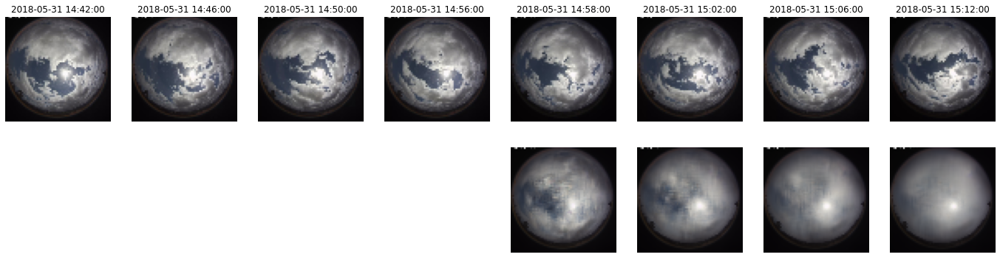

-------------------------------------------------- sample  30 --------------------------------------------------


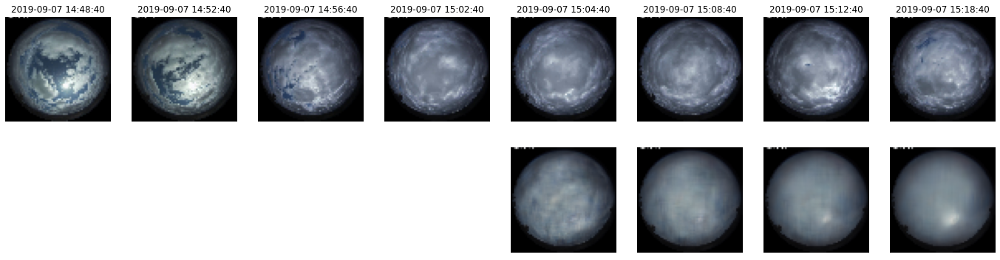

In [17]:
for i in range(select_num_samples):
    print("-"*50,"sample ",str(i+1), "-"*50)
    f, ax = plt.subplots(2,8)
    f.set_size_inches(24,6)
    ax[0,0].imshow(images_log_test[select_idx[i]][0][:,:,::-1])
    ax[0,0].set_title(times_curr_test[select_idx[i]]-datetime.timedelta(minutes=15))
    ax[0,1].imshow(images_log_test[select_idx[i]][2][:,:,::-1])
    ax[0,1].set_title(times_curr_test[select_idx[i]]-datetime.timedelta(minutes=11))
    ax[0,2].imshow(images_log_test[select_idx[i]][4][:,:,::-1])
    ax[0,2].set_title(times_curr_test[select_idx[i]]-datetime.timedelta(minutes=7))
    ax[0,3].imshow(images_log_test[select_idx[i]][7][:,:,::-1])
    ax[0,3].set_title(times_curr_test[select_idx[i]]-datetime.timedelta(minutes=1))
    ax[0,4].imshow(images_pred_test[select_idx[i]][0][:,:,::-1])
    ax[0,4].set_title(times_curr_test[select_idx[i]]+datetime.timedelta(minutes=1))
    ax[0,5].imshow(images_pred_test[select_idx[i]][2][:,:,::-1])
    ax[0,5].set_title(times_curr_test[select_idx[i]]+datetime.timedelta(minutes=5))
    ax[0,6].imshow(images_pred_test[select_idx[i]][4][:,:,::-1])
    ax[0,6].set_title(times_curr_test[select_idx[i]]+datetime.timedelta(minutes=9))
    ax[0,7].imshow(images_pred_test[select_idx[i]][7][:,:,::-1])
    ax[0,7].set_title(times_curr_test[select_idx[i]]+datetime.timedelta(minutes=15))
    
    ax[1,4].imshow(predictions[select_idx[i]][0][:,:,::-1])
    ax[1,5].imshow(predictions[select_idx[i]][2][:,:,::-1])
    ax[1,6].imshow(predictions[select_idx[i]][4][:,:,::-1])
    ax[1,7].imshow(predictions[select_idx[i]][7][:,:,::-1])
    
    ax[0,0].axis('off')
    ax[0,1].axis('off')
    ax[0,2].axis('off')
    ax[0,3].axis('off')
    ax[0,4].axis('off')
    ax[0,5].axis('off')
    ax[0,6].axis('off')
    ax[0,7].axis('off')
    ax[1,0].axis('off')
    ax[1,1].axis('off')
    ax[1,2].axis('off')
    ax[1,3].axis('off')
    ax[1,4].axis('off')
    ax[1,5].axis('off')
    ax[1,6].axis('off')
    ax[1,7].axis('off')
    
    plt.show()